In [1]:
# !pip install cupy-cuda12x

In [2]:
import os
import numpy as np
import cupy as cp
# import numba as nb
import datetime as dt
import tensorflow as tf
from tensorflow import keras
import pandas as pd
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from scipy.stats import pearsonr
import h5py
from keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, Reshape
from keras.models import Sequential
from keras.optimizers import Adam
# from attention import Attention

In [3]:
len(tf.config.list_physical_devices('GPU'))

1

In [4]:
tf.test.is_gpu_available

<function tensorflow.python.framework.test_util.is_gpu_available(cuda_only=False, min_cuda_compute_capability=None)>

In [5]:
gpu_available = tf.test.is_gpu_available()
is_cuda_gpu_available = tf.test.is_gpu_available(cuda_only=True)
is_cuda_gpu_min_3 = tf.test.is_gpu_available(True, (3,0))
tf.test.is_gpu_available

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


<function tensorflow.python.framework.test_util.is_gpu_available(cuda_only=False, min_cuda_compute_capability=None)>

In [6]:
tf.test.is_gpu_available

<function tensorflow.python.framework.test_util.is_gpu_available(cuda_only=False, min_cuda_compute_capability=None)>

In [7]:
%matplotlib inline
%config InlineBackend.figure_format='retina'

In [8]:
sns.set(style='whitegrid', palette='muted', font_scale=1.5)
rcParams['figure.figsize'] = 16, 10
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)

In [9]:
tf.config.experimental.enable_op_determinism()

In [10]:
df = pd.read_csv('F:\Work\Time Series Forecast_Water Levels\Impute_misvalues_hungyen.csv')
df.head()

,Date,Hour,Waterlevel
0,1/1/2008,0,47.0
1,1/1/2008,1,43.0
2,1/1/2008,2,40.0
3,1/1/2008,3,37.0
4,1/1/2008,4,34.0


In [11]:
df['Hour'] = df['Hour'].replace('#NUM!', 0)

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64061 entries, 0 to 64060
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Date        64061 non-null  object 
 1   Hour        64061 non-null  object 
 2   Waterlevel  64061 non-null  float64
dtypes: float64(1), object(2)
memory usage: 1.5+ MB


In [13]:
df.describe()

,Waterlevel
count,64061.000000
mean,138.135113
std,97.020489
min,-26.000000
25%,75.000000
50%,116.000000
75%,171.000000
max,651.000000


In [14]:
df.isnull().sum()

Date          0
Hour          0
Waterlevel    0
dtype: int64

In [15]:
df['Hour'] = pd.to_datetime(df['Hour'], format='%H', errors='coerce').dt.time
df.head()

,Date,Hour,Waterlevel
0,1/1/2008,00:00:00,47.0
1,1/1/2008,01:00:00,43.0
2,1/1/2008,02:00:00,40.0
3,1/1/2008,03:00:00,37.0
4,1/1/2008,04:00:00,34.0


In [16]:
df['Hour'] = df['Hour'].astype(str)


df['DateTime'] = pd.to_datetime(
    df['Date'] + ' ' + df['Hour']
        )
df = df.set_index('DateTime')
df.drop(['Date', 'Hour'], 
        axis = 1, inplace = True)

df.head()

,Waterlevel
DateTime,
2008-01-01 00:00:00,47.0
2008-01-01 01:00:00,43.0
2008-01-01 02:00:00,40.0
2008-01-01 03:00:00,37.0
2008-01-01 04:00:00,34.0


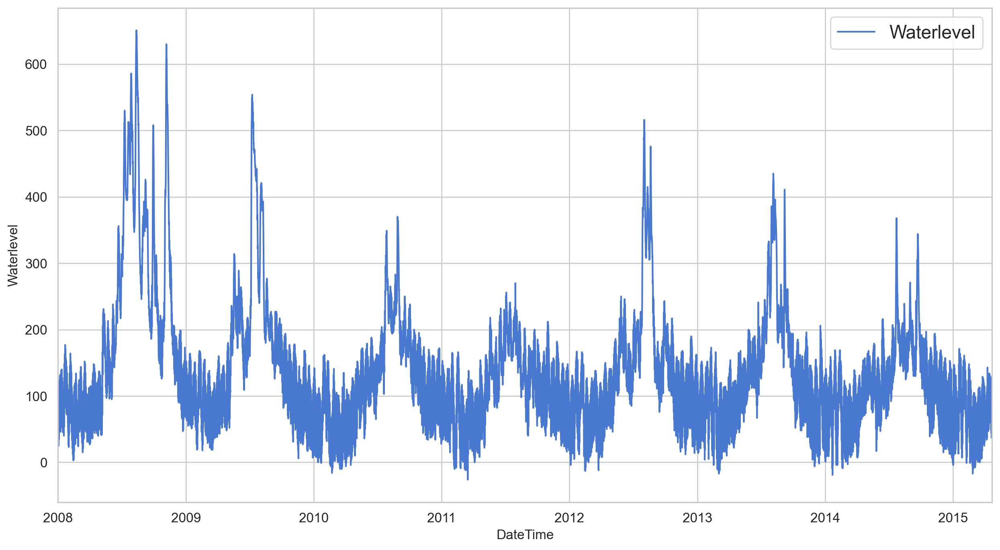

In [17]:
df.plot(y='Waterlevel', subplots=True, figsize=(15, 8), fontsize=12)
plt.xlabel('DateTime', fontsize=12)
plt.ylabel('Waterlevel', fontsize=12)
plt.show()

In [18]:
train_size = int(len(df) * 0.7)
val_size = int(len(df) * 0.85)
train, val, test = df[:train_size].iloc[:, [-1]], df[train_size:val_size].iloc[:, [-1]] , df[val_size:].iloc[:, [-1]]

train, val, test

(                     Waterlevel
 DateTime                       
 2008-01-01 00:00:00        47.0
 2008-01-01 01:00:00        43.0
 2008-01-01 02:00:00        40.0
 2008-01-01 03:00:00        37.0
 2008-01-01 04:00:00        34.0
 ...                         ...
 2013-02-11 05:00:00        86.0
 2013-02-11 06:00:00       100.0
 2013-02-11 07:00:00       115.0
 2013-02-11 08:00:00       128.0
 2013-02-11 09:00:00       134.0
 
 [44842 rows x 1 columns],
                      Waterlevel
 DateTime                       
 2013-02-11 10:00:00       133.0
 2013-02-11 11:00:00       127.0
 2013-02-11 12:00:00       122.0
 2013-02-11 13:00:00       115.0
 2013-02-11 14:00:00       107.0
 ...                         ...
 2014-03-18 14:00:00        46.0
 2014-03-18 15:00:00        54.0
 2014-03-18 16:00:00        61.0
 2014-03-18 17:00:00        65.0
 2014-03-18 18:00:00        65.0
 
 [9609 rows x 1 columns],
                      Waterlevel
 DateTime                       
 2014-03-18 19:00:0

In [19]:
train.shape, val.shape, test.shape

((44842, 1), (9609, 1), (9610, 1))

Text(0, 0.5, 'Waterlevel')

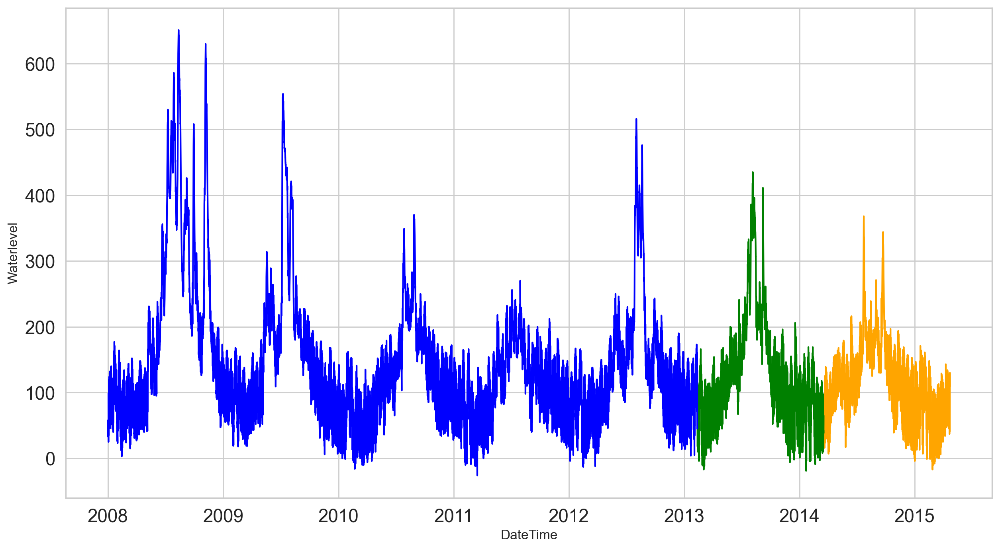

In [20]:
plt.figure(figsize = (15,8))
plt.plot(test.index, test['Waterlevel'], label = "test", color = 'orange')
plt.plot(val.index, val['Waterlevel'], label = "val", color = 'green')
plt.plot(train.index, train['Waterlevel'], label = "train" , color = 'blue')
plt.xlabel('DateTime', fontsize=12)
plt.ylabel('Waterlevel', fontsize=12)

In [21]:
scaler = MinMaxScaler()
train['Waterlevel'] = scaler.fit_transform(train)
val['Waterlevel'] = scaler.transform(val)
test['Waterlevel'] = scaler.transform(test)

In [22]:
train_data = train.values
val_data = val.values
test_data = test.values

In [23]:
timesteps = 164

In [24]:
train_data_timesteps=np.array([[j for j in train_data[i:i+timesteps]] 
                               for i in range(0,len(train_data)-timesteps+1)])[:,:,0]
val_data_timesteps=np.array([[j for j in val_data[i:i+timesteps]] 
                             for i in range(0,len(val_data)-timesteps+1)])[:,:,0]
test_data_timesteps=np.array([[j for j in test_data[i:i+timesteps]] 
                              for i in range(0,len(test_data)-timesteps+1)])[:,:,0]


In [25]:
x_train, y_train = train_data_timesteps[:,:timesteps-1],train_data_timesteps[:,[timesteps-1]]
x_val, y_val = val_data_timesteps[:,:timesteps-1],val_data_timesteps[:,[timesteps-1]]
x_test, y_test = test_data_timesteps[:,:timesteps-1],test_data_timesteps[:,[timesteps-1]]

x_train, y_train

(array([[0.10782866, 0.10192024, 0.09748892, ..., 0.17282127, 0.16395864,
         0.15509601],
        [0.10192024, 0.09748892, 0.09305761, ..., 0.16395864, 0.15509601,
         0.14623338],
        [0.09748892, 0.09305761, 0.08862629, ..., 0.15509601, 0.14623338,
         0.13737075],
        ...,
        [0.1816839 , 0.17725258, 0.17282127, ..., 0.14327917, 0.16543575,
         0.18611521],
        [0.17725258, 0.17282127, 0.16838996, ..., 0.16543575, 0.18611521,
         0.20827179],
        [0.17282127, 0.16838996, 0.16395864, ..., 0.18611521, 0.20827179,
         0.22747415]]),
 array([[0.14623338],
        [0.13737075],
        [0.12998523],
        ...,
        [0.20827179],
        [0.22747415],
        [0.23633678]]))

In [26]:
def calculate_metrics(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))

    squared_error = np.mean((y_true - y_pred)**2)

    r, _ = pearsonr(y_true, y_pred)
    
    T = len(y_true)
    max_x = max(y_true)
    min_x = min(y_true)
    
    sim_sum = 0
    for i in range(T):
        sim_sum += 1 / (1 + abs(y_pred[i] - y_true[i]) / (max_x - min_x))
    sim = sim_sum / T
    
    sd_y = np.std(y_pred)
    sd_x = np.std(y_test)
    fsd = 2 * np.abs(sd_y - sd_x) / (sd_y + sd_x)
    
    nse = 1 - (np.sum((y_pred - y_true) ** 2) / np.sum((y_true - np.mean(y_true)) ** 2))
    
    return {
        'MAE': mae,
        'RMSE': rmse,
        'MSE' : squared_error,
        'R': r,
        'SIM': sim,
        'FSD': fsd,
        'NSE': nse
    }

In [27]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import *
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.optimizers import Adam

In [28]:
class AttentionLayer(Layer):
    def __init__(self, **kwargs):
        super(AttentionLayer, self).__init__(**kwargs)

    def build(self, input_shape):
        self.W = self.add_weight(name='attention_weight', shape=(input_shape[-1], 1), 
                                 initializer='random_normal', trainable=True)
        self.b = self.add_weight(name='attention_bias', shape=(input_shape[1], 1), 
                                 initializer='zeros', trainable=True)        
        super(AttentionLayer, self).build(input_shape)
 
    def call(self, x):
        e = tf.tanh(tf.linalg.matmul(x, self.W) + self.b)
        e = tf.squeeze(e, axis=-1)
        alpha = tf.nn.softmax(e)
        alpha = tf.expand_dims(alpha, axis=-1)
        context = x * alpha
        context = tf.reduce_sum(context, axis=1)
        return context

    def compute_output_shape(self, input_shape):
        return (input_shape[0], input_shape[-1])

# CNN-LSTM

In [29]:
# model_5 = keras.Sequential()

# model_5.add(Conv1D(8, 3, activation='relu', padding = 'same',
#                             input_shape=(x_train.shape[1], 1)))
# model_5.add(MaxPooling1D(pool_size=2, strides=2))
# model_5.add(Conv1D(16, 3, activation='relu', padding = 'same'))
# model_5.add(MaxPooling1D(pool_size=2, strides=2))
# model_5.add(Conv1D(32, 3, activation='relu', padding = 'same'))
# model_5.add(MaxPooling1D(pool_size=2, strides=2))
# model_5.add(Conv1D(64, 3, activation='relu', padding = 'same'))
# model_5.add(MaxPooling1D(pool_size=2, strides=2))
# model_5.add(Conv1D(128, 3, activation='relu', padding = 'same'))
# model_5.add(MaxPooling1D(pool_size=2, strides=2))
# model_5.add(Conv1D(256, 3, activation='relu', padding = 'same'))
# model_5.add(MaxPooling1D(pool_size=2, strides=2))
# model_5.add(keras.layers.LSTM(units=256,activation = 'tanh'))
# model_5.add(Dropout(0.1))
# model_5.add(Flatten())

# model_5.add(Dense(100, 'relu'))
# model_5.add(Dropout(0.1))
# model_5.add(Dense((1), 'linear'))

# model_5.compile(
#   loss=MeanSquaredError(),
#   optimizer=Adam(learning_rate=0.0001),
#   metrics=[RootMeanSquaredError()]
# )

# model_5.fit(
#     x_train, y_train,
#     validation_data=(x_val, y_val),
#     epochs=200,
#     batch_size=32,                       
#     verbose=1,
#     shuffle=False
# )                                               
# # model_5.save('Model_5.h5')
# model_5.summary()

# CNN-LSTM-es

In [30]:
# model_5 = keras.Sequential()

# model_5.add(Conv1D(8, 3, activation='relu', padding = 'same',
#                             input_shape=(x_train.shape[1], 1)))
# model_5.add(MaxPooling1D(pool_size=2, strides=2))
# model_5.add(Conv1D(16, 3, activation='relu', padding = 'same'))
# model_5.add(MaxPooling1D(pool_size=2, strides=2))
# model_5.add(Conv1D(32, 3, activation='relu', padding = 'same'))
# model_5.add(MaxPooling1D(pool_size=2, strides=2))
# model_5.add(Conv1D(64, 3, activation='relu', padding = 'same'))
# model_5.add(MaxPooling1D(pool_size=2, strides=2))
# model_5.add(Conv1D(128, 3, activation='relu', padding = 'same'))
# model_5.add(MaxPooling1D(pool_size=2, strides=2))
# model_5.add(Conv1D(256, 3, activation='relu', padding = 'same'))
# model_5.add(MaxPooling1D(pool_size=2, strides=2))
# model_5.add(keras.layers.LSTM(units=256,activation = 'tanh'))
# model_5.add(Dropout(0.1))
# model_5.add(Flatten())

# model_5.add(Dense(100, 'relu'))
# model_5.add(Dropout(0.1))
# model_5.add(Dense((1), 'linear'))

# model_5.compile(
#   loss=MeanSquaredError(),
#   optimizer=Adam(learning_rate=0.0001),
#   metrics=[RootMeanSquaredError()]
# )

# model_5.fit(
#     x_train, y_train,
#     validation_data=(x_val, y_val),
#     epochs=200,
#     batch_size=32,
#     callbacks=[EarlyStopping(monitor='val_loss', 
#                              patience=10, 
#                              restore_best_weights=True)],                       
#     verbose=1,
#     shuffle=False
# )                                               
# # model_5.save('Model_5.h5')
# model_5.summary()

In [31]:
# time = int(input("Enter the first time you want to forecast:"))
time = 77
hours = 120
pred = []

def forecast(model, hours, time):
    pred = []
    # current_window = x_val[-1,:].tolist()
    current_window = x_test[time,:].tolist()
    for i in range(hours):
        # Chuyển current_window thành numpy array khi gọi predict
        y_pred = model.predict(np.asarray([current_window]))[0]
        pred.append(float(y_pred[0]))
        current_window.pop(0)
        current_window.append(pred[-1])
    pred_array = np.array(pred).reshape(-1, 1)
    return pred_array

In [32]:
# y_fc = forecast(model_5, hours, time)
# y_pred = model_5.predict(x_test[time:])

# y_test_original = scaler.inverse_transform(y_test)
# y_pred_original = scaler.inverse_transform(y_pred)
# y_fc_original = scaler.inverse_transform(y_fc)

# time_forecast = [3,  6, 12, 24, 36, 72, 120]
# for hours in time_forecast:
#     plt.figure(figsize=(20, 6))
    
#     plt.plot(y_test_original[time : time + hours].flatten(), label='Actual', color='blue', marker='o')
#     plt.plot(y_pred_original[: hours], label='Predicted', color='red', marker='x')
#     plt.plot(y_fc_original[: hours].flatten(), label='Forecast', color='green', marker='x')
#     plt.title('Comparison of Actual and Predicted Values')
#     plt.xlabel('Hours')
#     plt.ylabel('Waterlevel')
#     plt.legend()

#     plt.show()
    
# for hours in time_forecast:
#     metrics = calculate_metrics(y_test_original[time : time + hours].flatten(), y_fc_original[:hours].flatten())
#     for metric, value in metrics.items():
#         print(f'Using model LSTM {hours} hours {metric}: {value}')

#     print('\n')

In [33]:
# model_5.save('cnn_lstm_es.h5')

# LSTM

In [34]:
# model_LSTM = keras.Sequential()

# model_LSTM.add(keras.layers.LSTM(units=512, activation = 'tanh',
#                             return_sequences=True, 
#                             input_shape=(x_train.shape[1], 1)))
# model_LSTM.add(Dropout(0.1))
# model_LSTM.add(keras.layers.LSTM(units=256,activation = 'tanh',
#                             return_sequences=True))
# model_LSTM.add(Dropout(0.1))
# model_LSTM.add(keras.layers.LSTM(units=64,activation = 'tanh',
#                             return_sequences=True))
# model_LSTM.add(Dropout(0.1))
# model_LSTM.add(keras.layers.LSTM(units=32))
# model_LSTM.add(Flatten())
# model_LSTM.add(Dense(32, 'relu'))
# model_LSTM.add(Dropout(0.1))
# model_LSTM.add(Dense((1), 'linear'))

# model_LSTM.compile(
#   loss=MeanSquaredError(),
#   optimizer=Adam(learning_rate=0.0001),
#   metrics=[RootMeanSquaredError()]
# )
# model_LSTM.summary()
# model_LSTM.fit(
#     x_train, y_train,
#     validation_data=(x_val, y_val),
#     epochs=100,
#     batch_size=32,                       
#     verbose=1,
#     shuffle=False
# )

In [35]:
# y_fc = forecast(model_LSTM, hours, time)
# y_pred = model_LSTM.predict(x_test[time:])

# y_test_original = scaler.inverse_transform(y_test)
# y_pred_original = scaler.inverse_transform(y_pred)
# y_fc_original = scaler.inverse_transform(y_fc)

# time_forecast = [3,  6, 12, 24, 36, 72, 120]
# for hours in time_forecast:
#     plt.figure(figsize=(20, 6))
    
#     plt.plot(y_test_original[time : time + hours].flatten(), label='Actual', color='blue', marker='o')
#     plt.plot(y_pred_original[: hours], label='Predicted', color='red', marker='x')
#     plt.plot(y_fc_original[: hours].flatten(), label='Forecast', color='green', marker='x')
#     plt.title('Comparison of Actual and Predicted Values')
#     plt.xlabel('Hours')
#     plt.ylabel('Waterlevel')
#     plt.legend()

#     plt.show()
    
# for hours in time_forecast:
#     metrics = calculate_metrics(y_test_original[time : time + hours].flatten(), y_fc_original[:hours].flatten())
#     for metric, value in metrics.items():
#         print(f'Using model LSTM {hours} hours {metric}: {value}')

#     print('\n')

In [36]:
# model_LSTM.save('lstm.h5')

# LSTM-es

In [37]:
# model_LSTM1 = keras.Sequential()

# model_LSTM1.add(keras.layers.LSTM(units=512, activation = 'tanh',
#                             return_sequences=True, 
#                             input_shape=(x_train.shape[1], 1)))
# model_LSTM1.add(Dropout(0.1))
# model_LSTM1.add(keras.layers.LSTM(units=256,activation = 'tanh',
#                             return_sequences=True))
# model_LSTM1.add(Dropout(0.1))
# model_LSTM1.add(keras.layers.LSTM(units=64,activation = 'tanh',
#                             return_sequences=True))
# model_LSTM1.add(Dropout(0.1))
# model_LSTM1.add(keras.layers.LSTM(units=32))
# model_LSTM1.add(Flatten())
# model_LSTM1.add(Dense(32, 'relu'))
# model_LSTM1.add(Dropout(0.1))
# model_LSTM1.add(Dense((1), 'linear'))

# model_LSTM1.compile(
#   loss=MeanSquaredError(),
#   optimizer=Adam(learning_rate=0.0001),
#   metrics=[RootMeanSquaredError()]
# )
# model_LSTM1.summary()
# model_LSTM1.fit(
#     x_train, y_train,
#     validation_data=(x_val, y_val),
#     epochs=100,
#     batch_size=32,
#     callbacks=[EarlyStopping(monitor='val_loss', 
#                              patience=10, 
#                              restore_best_weights=True)],                       
#     verbose=1,
#     shuffle=False
# )

In [38]:
# y_fc = forecast(model_LSTM1, hours, time)
# y_pred = model_LSTM1.predict(x_test[time:])

# y_test_original = scaler.inverse_transform(y_test)
# y_pred_original = scaler.inverse_transform(y_pred)
# y_fc_original = scaler.inverse_transform(y_fc)

# time_forecast = [3,  6, 12, 24, 36, 72, 120]
# for hours in time_forecast:
#     plt.figure(figsize=(20, 6))
    
#     plt.plot(y_test_original[time : time + hours].flatten(), label='Actual', color='blue', marker='o')
#     plt.plot(y_pred_original[: hours], label='Predicted', color='red', marker='x')
#     plt.plot(y_fc_original[: hours].flatten(), label='Forecast', color='green', marker='x')
#     plt.title('Comparison of Actual and Predicted Values')
#     plt.xlabel('Hours')
#     plt.ylabel('Waterlevel')
#     plt.legend()

#     plt.show()
    
# for hours in time_forecast:
#     metrics = calculate_metrics(y_test_original[time : time + hours].flatten(), y_fc_original[:hours].flatten())
#     for metric, value in metrics.items():
#         print(f'Using model LSTM {hours} hours {metric}: {value}')

#     print('\n')

In [39]:
# model_LSTM1.save('lstm_es.h5')

# LSTM-AM

In [40]:
# model_lstm_am = keras.Sequential()

# model_lstm_am.add(keras.layers.LSTM(units=512, activation = 'tanh',
#                             return_sequences=True, 
#                             input_shape=(x_train.shape[1], 1)))
# model_lstm_am.add(Dropout(0.1))
# model_lstm_am.add(keras.layers.LSTM(units=256,activation = 'tanh',
#                             return_sequences=True))
# model_lstm_am.add(Dropout(0.1))
# model_lstm_am.add(keras.layers.LSTM(units=64,activation = 'tanh',
#                             return_sequences=True))
# model_lstm_am.add(Dropout(0.1))
# model_lstm_am.add(keras.layers.LSTM(units=32,activation = 'tanh',
#                             return_sequences=True))
# # model_lstm_am.add(Dropout(0.1))
# # model_lstm_am.add(Flatten())

# model_lstm_am.add(AttentionLayer())

# model_lstm_am.add(Flatten())
# model_lstm_am.add(Dense(32, 'relu'))
# model_lstm_am.add(Dropout(0.1))
# model_lstm_am.add(Dense((1), 'linear'))

# model_lstm_am.compile(
#   loss=MeanSquaredError(),
#   optimizer=Adam(learning_rate=0.0001),
#   metrics=[RootMeanSquaredError()]
# )
# model_lstm_am.summary()
# model_lstm_am.fit(
#     x_train, y_train,
#     validation_data=(x_val, y_val),
#     epochs=100,
#     batch_size=32,                       
#     verbose=1,
#     shuffle=False
# )

In [41]:
# y_fc = forecast(model_lstm_am, hours, time)
# y_pred = model_lstm_am.predict(x_test[time:])

# y_test_original = scaler.inverse_transform(y_test)
# y_pred_original = scaler.inverse_transform(y_pred)
# y_fc_original = scaler.inverse_transform(y_fc)

# time_forecast = [3,  6, 12, 24, 36, 72, 120]
# for hours in time_forecast:
#     plt.figure(figsize=(20, 6))
    
#     plt.plot(y_test_original[time : time + hours].flatten(), label='Actual', color='blue', marker='o')
#     plt.plot(y_pred_original[: hours], label='Predicted', color='red', marker='x')
#     plt.plot(y_fc_original[: hours].flatten(), label='Forecast', color='green', marker='x')
#     plt.title('Comparison of Actual and Predicted Values')
#     plt.xlabel('Hours')
#     plt.ylabel('Waterlevel')
#     plt.legend()

#     plt.show()
    
# for hours in time_forecast:
#     metrics = calculate_metrics(y_test_original[time : time + hours].flatten(), y_fc_original[:hours].flatten())
#     for metric, value in metrics.items():
#         print(f'Using model LSTM {hours} hours {metric}: {value}')

#     print('\n')

In [42]:
# model_lstm_am.save('lstm_am.h5')

# LSTM-AM-es

In [43]:
# model_lstm_am_es = keras.Sequential()

# model_lstm_am_es.add(keras.layers.LSTM(units=512, activation = 'tanh',
#                             return_sequences=True, 
#                             input_shape=(x_train.shape[1], 1)))
# model_lstm_am_es.add(Dropout(0.1))
# model_lstm_am_es.add(keras.layers.LSTM(units=256,activation = 'tanh',
#                             return_sequences=True))
# model_lstm_am_es.add(Dropout(0.1))
# model_lstm_am_es.add(keras.layers.LSTM(units=64,activation = 'tanh',
#                             return_sequences=True))
# model_lstm_am_es.add(Dropout(0.1))
# model_lstm_am_es.add(keras.layers.LSTM(units=32,activation = 'tanh',
#                             return_sequences=True))
# model_lstm_am_es.add(Dropout(0.1))
# # model_lstm_am.add(Flatten())

# model_lstm_am_es.add(AttentionLayer())

# model_lstm_am_es.add(Flatten())
# model_lstm_am_es.add(Dense(32, 'relu'))
# model_lstm_am_es.add(Dropout(0.1))
# model_lstm_am_es.add(Dense((1), 'linear'))

# model_lstm_am_es.compile(
#   loss=MeanSquaredError(),
#   optimizer=Adam(learning_rate=0.0001),
#   metrics=[RootMeanSquaredError()]
# )
# model_lstm_am_es.summary()
# model_lstm_am_es.fit(
#     x_train, y_train,
#     validation_data=(x_val, y_val),
#     callbacks=[EarlyStopping(monitor='val_loss', 
#                              patience=10, 
#                              restore_best_weights=True)],
#     epochs=100,
#     batch_size=32,                       
#     verbose=1,
#     shuffle=False
# )

In [44]:
# y_fc = forecast(model_lstm_am_es, hours, time)
# y_pred = model_lstm_am_es.predict(x_test[time:])

# y_test_original = scaler.inverse_transform(y_test)
# y_pred_original = scaler.inverse_transform(y_pred)
# y_fc_original = scaler.inverse_transform(y_fc)

# time_forecast = [3,  6, 12, 24, 36, 72, 120]
# for hours in time_forecast:
#     plt.figure(figsize=(20, 6))
    
#     plt.plot(y_test_original[time : time + hours].flatten(), label='Actual', color='blue', marker='o')
#     plt.plot(y_pred_original[: hours], label='Predicted', color='red', marker='x')
#     plt.plot(y_fc_original[: hours].flatten(), label='Forecast', color='green', marker='x')
#     plt.title('Comparison of Actual and Predicted Values')
#     plt.xlabel('Hours')
#     plt.ylabel('Waterlevel')
#     plt.legend()

#     plt.show()
    
# for hours in time_forecast:
#     metrics = calculate_metrics(y_test_original[time : time + hours].flatten(), y_fc_original[:hours].flatten())
#     for metric, value in metrics.items():
#         print(f'Using model LSTM {hours} hours {metric}: {value}')

#     print('\n')

In [45]:
# model_lstm_am_es.save('lstm_am_es.h5')

# CNN-AM


In [46]:
# model_cnn_am = keras.Sequential()

# model_cnn_am.add(Conv1D(8, 3, activation='relu', padding = 'same',
#                             input_shape=(x_train.shape[1], 1)))
# model_cnn_am.add(MaxPooling1D(pool_size=2, strides=2))
# model_cnn_am.add(Conv1D(16, 3, activation='relu', padding = 'same'))
# model_cnn_am.add(MaxPooling1D(pool_size=2, strides=2))
# model_cnn_am.add(Conv1D(32, 3, activation='relu', padding = 'same'))
# model_cnn_am.add(MaxPooling1D(pool_size=2, strides=2))
# model_cnn_am.add(Conv1D(64, 3, activation='relu', padding = 'same'))
# model_cnn_am.add(MaxPooling1D(pool_size=2, strides=2))
# model_cnn_am.add(Conv1D(128, 3, activation='relu', padding = 'same'))
# model_cnn_am.add(MaxPooling1D(pool_size=2, strides=2))
# model_cnn_am.add(Conv1D(256, 3, activation='relu', padding = 'same'))
# model_cnn_am.add(MaxPooling1D(pool_size=2, strides=2))
# # model_cnn_am.add(keras.layers.LSTM(units=256,activation = 'tanh'))
# # model_cnn_am.add(Dropout(0.1))
# model_cnn_am.add(AttentionLayer())
# model_cnn_am.add(Flatten())
# model_cnn_am.add(Dense(100, 'relu'))
# model_cnn_am.add(Dropout(0.1))
# model_cnn_am.add(Dense((1), 'linear'))

# model_cnn_am.compile(
#   loss=MeanSquaredError(),
#   optimizer=Adam(learning_rate=0.0001),
#   metrics=[RootMeanSquaredError()]
# )

# model_cnn_am.fit(
#     x_train, y_train,
#     validation_data=(x_val, y_val),
#     epochs=100,
#     batch_size=32,                       
#     verbose=1,
#     shuffle=False
# )                                               
# model_cnn_am.save('Model_cnn_am.h5')
# model_cnn_am.summary()

In [47]:
y_fc = forecast(model_cnn_am, hours, time)
y_pred = model_cnn_am.predict(x_test[time:])

y_test_original = scaler.inverse_transform(y_test)
y_pred_original = scaler.inverse_transform(y_pred)
y_fc_original = scaler.inverse_transform(y_fc)

time_forecast = [3,  6, 12, 24, 36, 72, 120]
for hours in time_forecast:
    plt.figure(figsize=(20, 6))
    
    plt.plot(y_test_original[time : time + hours].flatten(), label='Actual', color='blue', marker='o')
    plt.plot(y_pred_original[: hours], label='Predicted', color='red', marker='x')
    plt.plot(y_fc_original[: hours].flatten(), label='Forecast', color='green', marker='x')
    plt.title('Comparison of Actual and Predicted Values')
    plt.xlabel('Hours')
    plt.ylabel('Waterlevel')
    plt.legend()

    plt.show()
    
for hours in time_forecast:
    metrics = calculate_metrics(y_test_original[time : time + hours].flatten(), y_fc_original[:hours].flatten())
    for metric, value in metrics.items():
        print(f'Using model LSTM {hours} hours {metric}: {value}')

    print('\n')

# CNN-AM-es


In [48]:
# model_cnn_am_es = keras.Sequential()

# model_cnn_am_es.add(Conv1D(8, 3, activation='relu', padding = 'same',
#                             input_shape=(x_train.shape[1], 1)))
# model_cnn_am_es.add(MaxPooling1D(pool_size=2, strides=2))
# model_cnn_am_es.add(Conv1D(16, 3, activation='relu', padding = 'same'))
# model_cnn_am_es.add(MaxPooling1D(pool_size=2, strides=2))
# model_cnn_am_es.add(Conv1D(32, 3, activation='relu', padding = 'same'))
# model_cnn_am_es.add(MaxPooling1D(pool_size=2, strides=2))
# model_cnn_am_es.add(Conv1D(64, 3, activation='relu', padding = 'same'))
# model_cnn_am_es.add(MaxPooling1D(pool_size=2, strides=2))
# model_cnn_am_es.add(Conv1D(128, 3, activation='relu', padding = 'same'))
# model_cnn_am_es.add(MaxPooling1D(pool_size=2, strides=2))
# model_cnn_am_es.add(Conv1D(256, 3, activation='relu', padding = 'same'))
# model_cnn_am_es.add(MaxPooling1D(pool_size=2, strides=2))
# # model_cnn_am_es.add(keras.layers.LSTM(units=256,activation = 'tanh'))
# # model_cnn_am_es.add(Dropout(0.1))
# model_cnn_am_es.add(AttentionLayer())
# model_cnn_am_es.add(Flatten())
# model_cnn_am_es.add(Dense(100, 'relu'))
# model_cnn_am_es.add(Dropout(0.1))
# model_cnn_am_es.add(Dense((1), 'linear'))

# model_cnn_am_es.compile(
#   loss=MeanSquaredError(),
#   optimizer=Adam(learning_rate=0.0001),
#   metrics=[RootMeanSquaredError()]
# )

# model_cnn_am_es.fit(
#     x_train, y_train,
#     validation_data=(x_val, y_val),
#     epochs=100,
#     batch_size=32,
#     callbacks=[EarlyStopping(monitor='val_loss', 
#                              patience=10, 
#                              restore_best_weights=True)],                       
#     verbose=1,
#     shuffle=False
# )                                               
# model_cnn_am_es.save('Model_cnn_am_es.h5')
# model_cnn_am_es.summary()

In [49]:
# y_fc = forecast(model_cnn_am_es, hours, time)
# y_pred = model_cnn_am_es.predict(x_test[time:])

# y_test_original = scaler.inverse_transform(y_test)
# y_pred_original = scaler.inverse_transform(y_pred)
# y_fc_original = scaler.inverse_transform(y_fc)

# time_forecast = [3,  6, 12, 24, 36, 72, 120]
# for hours in time_forecast:
#     plt.figure(figsize=(20, 6))
    
#     plt.plot(y_test_original[time : time + hours].flatten(), label='Actual', color='blue', marker='o')
#     plt.plot(y_pred_original[: hours], label='Predicted', color='red', marker='x')
#     plt.plot(y_fc_original[: hours].flatten(), label='Forecast', color='green', marker='x')
#     plt.title('Comparison of Actual and Predicted Values')
#     plt.xlabel('Hours')
#     plt.ylabel('Waterlevel')
#     plt.legend()

#     plt.show()
    
# for hours in time_forecast:
#     metrics = calculate_metrics(y_test_original[time : time + hours].flatten(), y_fc_original[:hours].flatten())
#     for metric, value in metrics.items():
#         print(f'Using model LSTM {hours} hours {metric}: {value}')

#     print('\n')

# CNN-LSTM-AM


In [50]:
model = keras.Sequential()

model.add(Conv1D(8, 3, activation='relu', padding = 'same',
                            input_shape=(x_train.shape[1], 1)))
model.add(MaxPooling1D(pool_size=2, strides=2))
model.add(Conv1D(16, 3, activation='relu', padding = 'same'))
model.add(MaxPooling1D(pool_size=2, strides=2))
model.add(Conv1D(32, 3, activation='relu', padding = 'same'))
model.add(MaxPooling1D(pool_size=2, strides=2))
model.add(Conv1D(64, 3, activation='relu', padding = 'same'))
model.add(MaxPooling1D(pool_size=2, strides=2))
model.add(Conv1D(128, 3, activation='relu', padding = 'same'))
model.add(MaxPooling1D(pool_size=2, strides=2))
model.add(Conv1D(256, 3, activation='relu', padding = 'same'))
model.add(MaxPooling1D(pool_size=2, strides=2))
model.add(keras.layers.LSTM(units=256,activation = 'tanh', return_sequences=True))
model.add(Dropout(0.1))


model.add(AttentionLayer())
model.add(Flatten())
model.add(Dense(100, 'relu'))
model.add(Dropout(0.1))
model.add(Dense((1), 'linear'))

model.compile(
  loss=MeanSquaredError(),
  optimizer=Adam(learning_rate=0.0001),
  metrics=[RootMeanSquaredError()]
)

model.fit(
    x_train, y_train,
    validation_data=(x_val, y_val),
    epochs=200,
    batch_size=32,                       
    verbose=1,
    shuffle=False
)                                               
model.save('cnn_lstm_am.h5')
model.summary()

Epoch 1/200
1397/1397 [==============================] - 13s 8ms/step - loss: 0.0093 - root_mean_squared_error: 0.0963 - val_loss: 0.0179 - val_root_mean_squared_error: 0.1336
Epoch 2/200
1397/1397 [==============================] - 11s 8ms/step - loss: 0.0098 - root_mean_squared_error: 0.0990 - val_loss: 0.0185 - val_root_mean_squared_error: 0.1359
Epoch 3/200
1397/1397 [==============================] - 11s 8ms/step - loss: 0.0116 - root_mean_squared_error: 0.1077 - val_loss: 0.0188 - val_root_mean_squared_error: 0.1369
Epoch 4/200
1397/1397 [==============================] - 10s 7ms/step - loss: 0.0134 - root_mean_squared_error: 0.1157 - val_loss: 0.0186 - val_root_mean_squared_error: 0.1364
Epoch 5/200
1397/1397 [==============================] - 10s 7ms/step - loss: 0.0128 - root_mean_squared_error: 0.1133 - val_loss: 0.0160 - val_root_mean_squared_error: 0.1264
Epoch 6/200
1397/1397 [==============================] - 10s 7ms/step - loss: 0.0115 - root_mean_squared_error: 0.1071 -

293/293 [==============================] - 1s 3ms/step


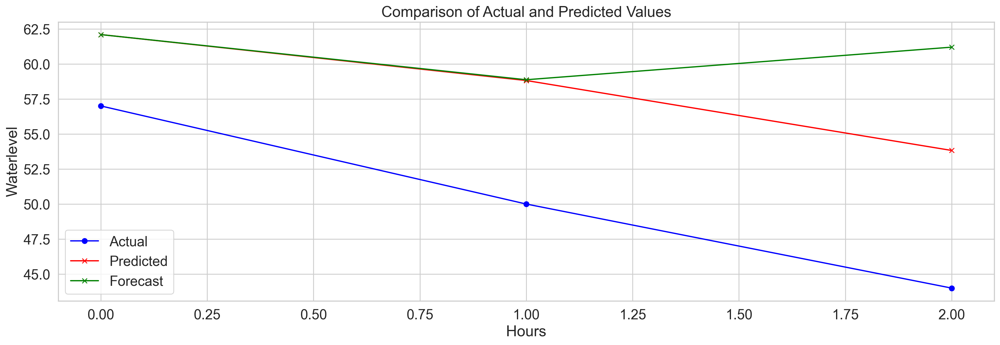

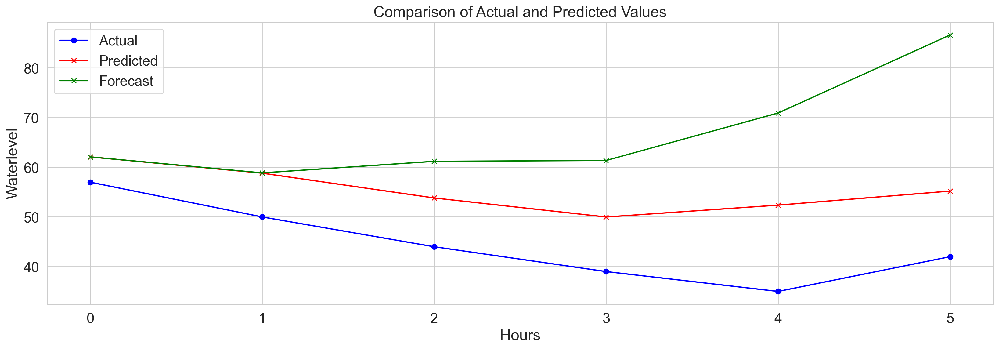

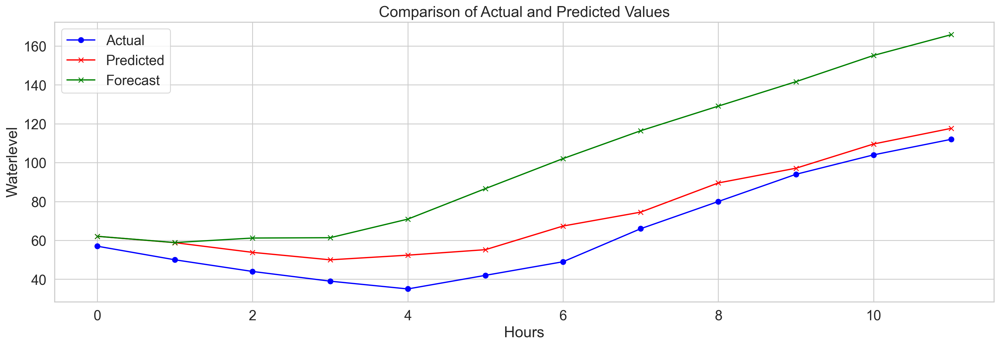

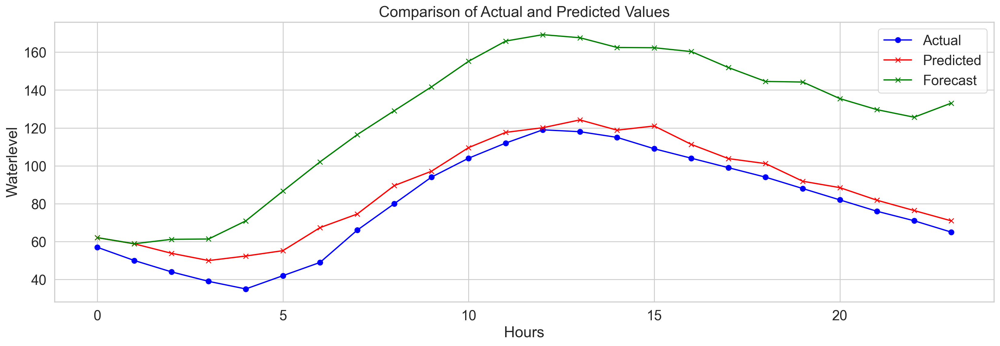

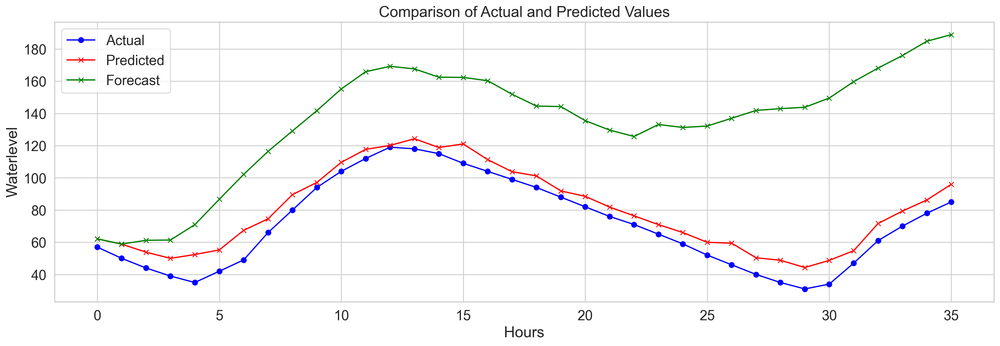

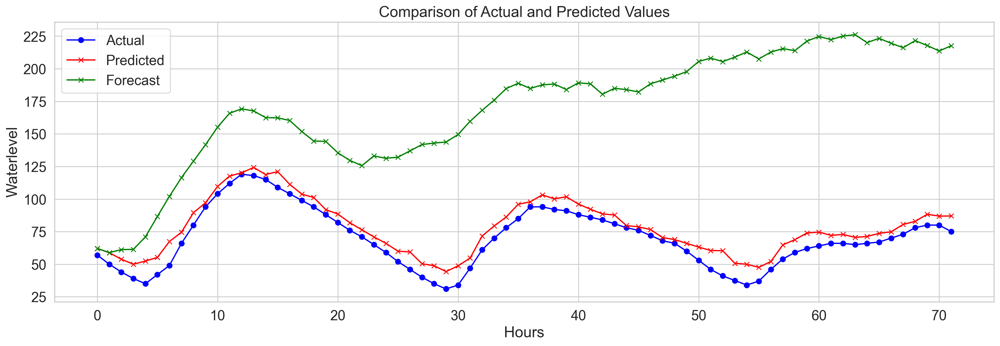

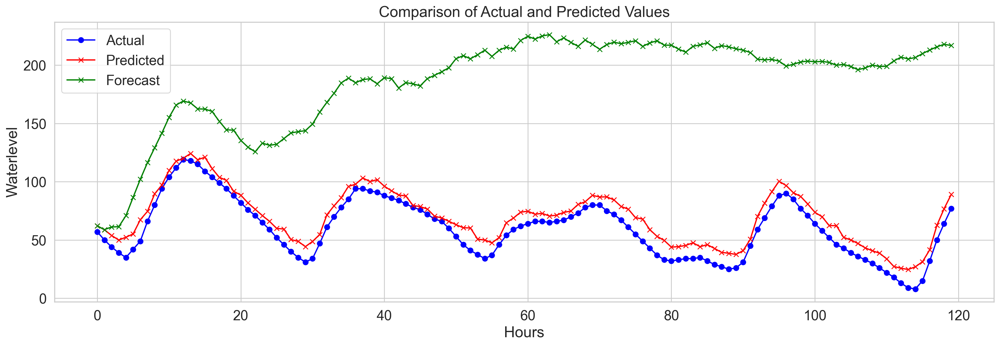

Using model LSTM 3 hours MAE: 10.38452083865801
Using model LSTM 3 hours RMSE: 11.550055668727953
Using model LSTM 3 hours MSE: 133.40378595071473
Using model LSTM 3 hours R: 0.3119507301894437
Using model LSTM 3 hours SIM: 0.5812028115361868
Using model LSTM 3 hours FSD: 1.7584449981217212
Using model LSTM 3 hours NSE: -3.726905801403288


Using model LSTM 6 hours MAE: 22.34735680868228
Using model LSTM 6 hours RMSE: 26.406046139909236
Using model LSTM 6 hours MSE: 697.2792727430156
Using model LSTM 6 hours R: -0.3796664681019939
Using model LSTM 6 hours SIM: 0.5486489753904745
Using model LSTM 6 hours FSD: 1.964084102409983
Using model LSTM 6 hours NSE: -12.345057851540963


Using model LSTM 12 hours MAE: 36.61343593647082
Using model LSTM 12 hours RMSE: 40.56225417459196
Using model LSTM 12 hours MSE: 1645.296463724203
Using model LSTM 12 hours R: 0.9228851904449189
Using model LSTM 12 hours SIM: 0.6963125804598628
Using model LSTM 12 hours FSD: 1.9908482621905623
Using model LSTM 1

In [51]:
y_fc = forecast(model, hours, time)
y_pred = model.predict(x_test[time:])

y_test_original = scaler.inverse_transform(y_test)
y_pred_original = scaler.inverse_transform(y_pred)
y_fc_original = scaler.inverse_transform(y_fc)

time_forecast = [3,  6, 12, 24, 36, 72, 120]
for hours in time_forecast:
    plt.figure(figsize=(20, 6))
    
    plt.plot(y_test_original[time : time + hours].flatten(), label='Actual', color='blue', marker='o')
    plt.plot(y_pred_original[: hours], label='Predicted', color='red', marker='x')
    plt.plot(y_fc_original[: hours].flatten(), label='Forecast', color='green', marker='x')
    plt.title('Comparison of Actual and Predicted Values')
    plt.xlabel('Hours')
    plt.ylabel('Waterlevel')
    plt.legend()

    plt.show()
    
for hours in time_forecast:
    metrics = calculate_metrics(y_test_original[time : time + hours].flatten(), y_fc_original[:hours].flatten())
    for metric, value in metrics.items():
        print(f'Using model LSTM {hours} hours {metric}: {value}')

    print('\n')

In [56]:
model = keras.Sequential()

# model.add(Conv1D(8, 3, activation='relu', padding = 'same',
#                             input_shape=(x_train.shape[1], 1)))
# model.add(MaxPooling1D(pool_size=2, strides=2))
# model.add(Conv1D(16, 3, activation='relu', padding = 'same'))
# model.add(MaxPooling1D(pool_size=2, strides=2))
# model.add(Conv1D(32, 3, activation='relu', padding = 'same'))
# model.add(MaxPooling1D(pool_size=2, strides=2))
# model.add(Conv1D(64, 3, activation='relu', padding = 'same'))
# model.add(MaxPooling1D(pool_size=2, strides=2))
model.add(Conv1D(64, 3, activation='relu', padding = 'same',
                            input_shape=(x_train.shape[1], 1)))
model.add(Conv1D(128, 3, activation='relu', padding = 'same'))
model.add(MaxPooling1D(pool_size=2, strides=2))
model.add(Conv1D(256, 3, activation='relu', padding = 'same'))
model.add(MaxPooling1D(pool_size=2, strides=2))
model.add(keras.layers.LSTM(units=256,activation = 'tanh', return_sequences=True))
# model.add(Dropout(0.1))


model.add(AttentionLayer())
model.add(Flatten())
model.add(Dense(100, 'relu'))
model.add(Dropout(0.1))
model.add(Dense((1), 'linear'))

model.compile(
  loss=MeanSquaredError(),
  optimizer=Adam(learning_rate=0.0001),
  metrics=[RootMeanSquaredError()]
)

model.fit(
    x_train, y_train,
    validation_data=(x_val, y_val),
    epochs=200,
    batch_size=32,
    callbacks=[EarlyStopping(monitor='val_loss', 
                             patience=10, 
                             restore_best_weights=True)],                       
    verbose=1,
    shuffle=False
)                                               
# model.save('cnn_lstm_am_es.h5')
model.summary()

Epoch 1/200
1397/1397 [==============================] - 13s 9ms/step - loss: 0.0068 - root_mean_squared_error: 0.0826 - val_loss: 0.0108 - val_root_mean_squared_error: 0.1041
Epoch 2/200
1397/1397 [==============================] - 12s 8ms/step - loss: 0.0067 - root_mean_squared_error: 0.0818 - val_loss: 0.0139 - val_root_mean_squared_error: 0.1179
Epoch 3/200
1397/1397 [==============================] - 11s 8ms/step - loss: 0.0067 - root_mean_squared_error: 0.0819 - val_loss: 0.0140 - val_root_mean_squared_error: 0.1183
Epoch 4/200
1397/1397 [==============================] - 11s 8ms/step - loss: 0.0066 - root_mean_squared_error: 0.0815 - val_loss: 0.0125 - val_root_mean_squared_error: 0.1116
Epoch 5/200
1397/1397 [==============================] - 11s 8ms/step - loss: 0.0065 - root_mean_squared_error: 0.0804 - val_loss: 0.0108 - val_root_mean_squared_error: 0.1038
Epoch 6/200
1397/1397 [==============================] - 11s 8ms/step - loss: 0.0064 - root_mean_squared_error: 0.0800 -

293/293 [==============================] - 1s 4ms/step


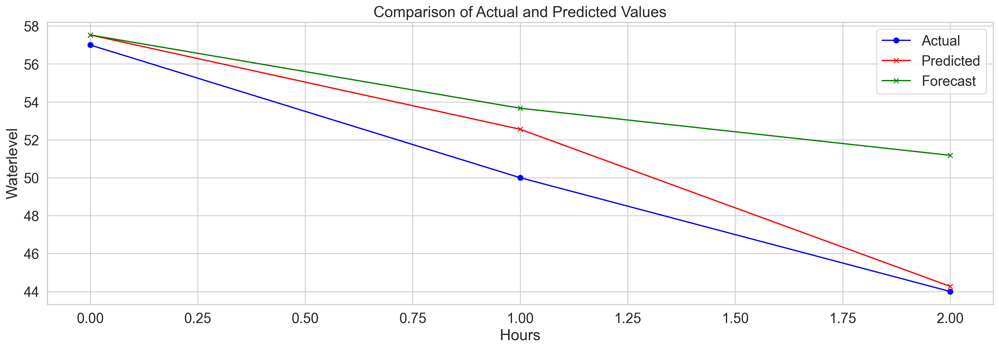

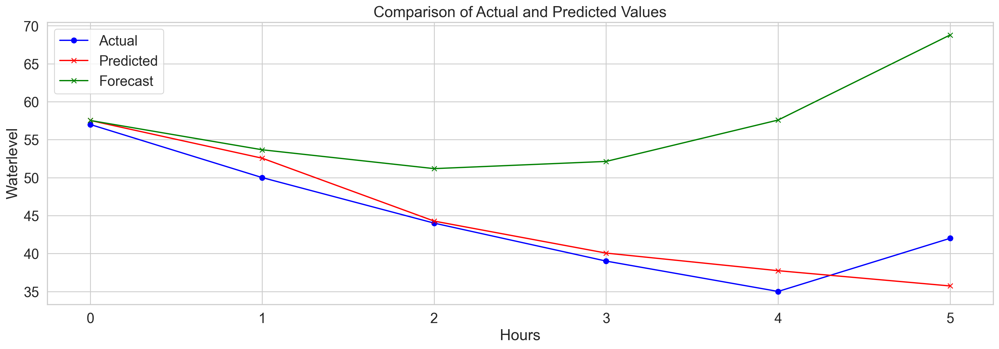

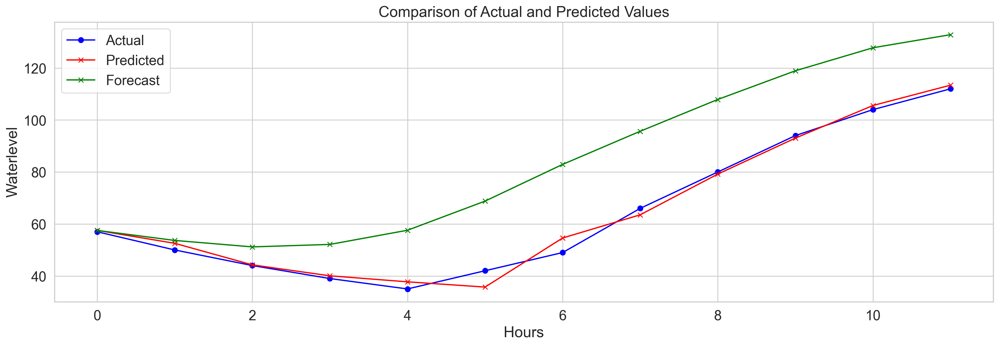

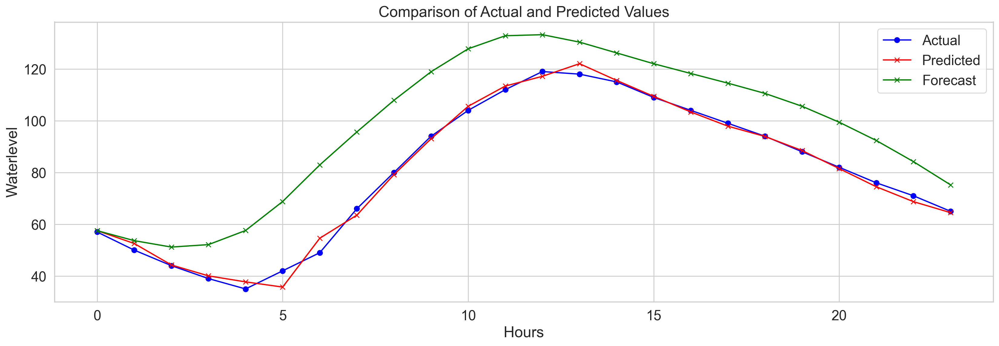

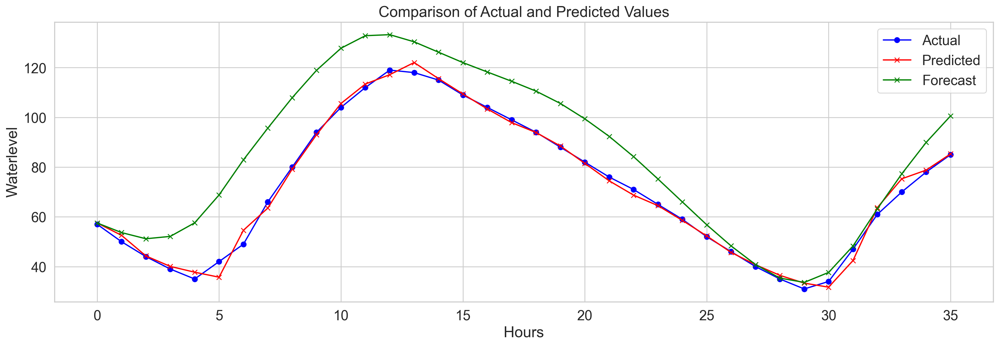

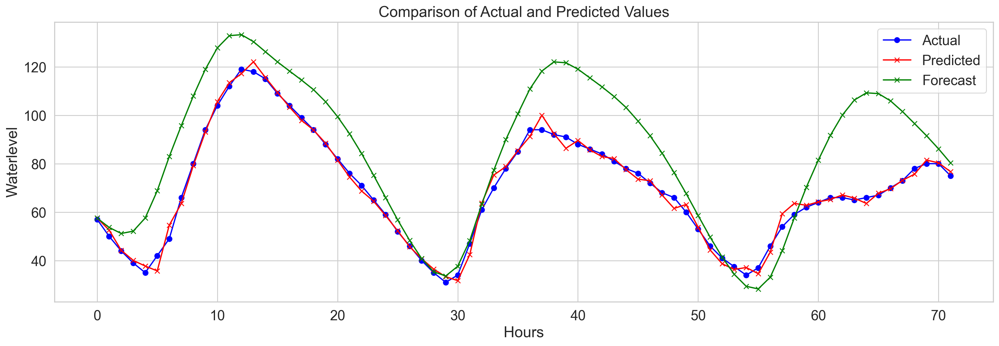

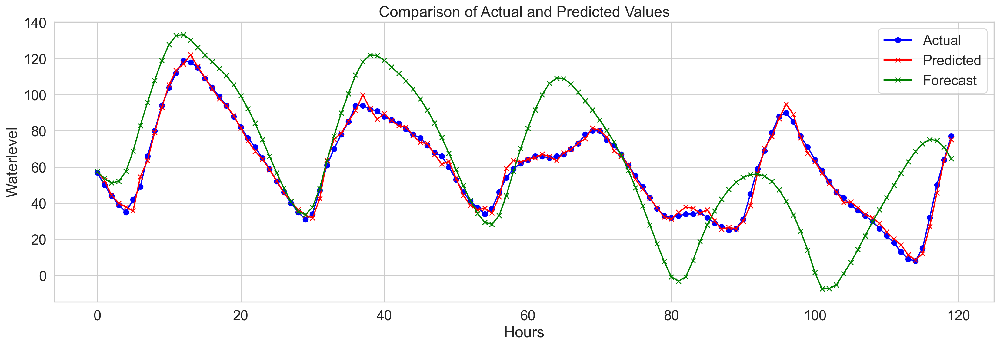

Using model LSTM 3 hours MAE: 3.7918590356906208
Using model LSTM 3 hours RMSE: 4.664947929046113
Using model LSTM 3 hours MSE: 21.761739180711615
Using model LSTM 3 hours R: 0.9967483414966684
Using model LSTM 3 hours SIM: 0.7950400748109128
Using model LSTM 3 hours FSD: 1.8706797781982085
Using model LSTM 3 hours NSE: 0.22891475343935064


Using model LSTM 6 hours MAE: 12.313187297433615
Using model LSTM 6 hours RMSE: 15.627997811490644
Using model LSTM 6 hours MSE: 244.23431559595636
Using model LSTM 6 hours R: -0.06673876412706428
Using model LSTM 6 hours SIM: 0.6930380080522789
Using model LSTM 6 hours FSD: 1.9415998057507518
Using model LSTM 6 hours NSE: -3.674340968343661


Using model LSTM 12 hours MAE: 19.579354890311752
Using model LSTM 12 hours RMSE: 22.169306111540095
Using model LSTM 12 hours MSE: 491.478133467169
Using model LSTM 12 hours R: 0.9429074242419943
Using model LSTM 12 hours SIM: 0.8073462928588183
Using model LSTM 12 hours FSD: 1.9884389915430676
Using model L

In [57]:
y_fc = forecast(model, hours, time)
y_pred = model.predict(x_test[time:])

y_test_original = scaler.inverse_transform(y_test)
y_pred_original = scaler.inverse_transform(y_pred)
y_fc_original = scaler.inverse_transform(y_fc)

time_forecast = [3,  6, 12, 24, 36, 72, 120]
for hours in time_forecast:
    plt.figure(figsize=(20, 6))
    
    plt.plot(y_test_original[time : time + hours].flatten(), label='Actual', color='blue', marker='o')
    plt.plot(y_pred_original[: hours], label='Predicted', color='red', marker='x')
    plt.plot(y_fc_original[: hours].flatten(), label='Forecast', color='green', marker='x')
    plt.title('Comparison of Actual and Predicted Values')
    plt.xlabel('Hours')
    plt.ylabel('Waterlevel')
    plt.legend()

    plt.show()
    
for hours in time_forecast:
    metrics = calculate_metrics(y_test_original[time : time + hours].flatten(), y_fc_original[:hours].flatten())
    for metric, value in metrics.items():
        print(f'Using model LSTM {hours} hours {metric}: {value}')

    print('\n')

In [58]:
model.save('cnn_lstm_am_es_1.h5')

In [59]:
model = keras.Sequential()

# model.add(Conv1D(8, 3, activation='relu', padding = 'same',
#                             input_shape=(x_train.shape[1], 1)))
# model.add(MaxPooling1D(pool_size=2, strides=2))
# model.add(Conv1D(16, 3, activation='relu', padding = 'same'))
# model.add(MaxPooling1D(pool_size=2, strides=2))
# model.add(Conv1D(32, 3, activation='relu', padding = 'same'))
# model.add(MaxPooling1D(pool_size=2, strides=2))
# model.add(Conv1D(64, 3, activation='relu', padding = 'same'))
# model.add(MaxPooling1D(pool_size=2, strides=2))
model.add(Conv1D(32, 3, activation='relu', padding = 'same',
                            input_shape=(x_train.shape[1], 1)))
model.add(Conv1D(64, 3, activation='relu', padding = 'same'))
model.add(MaxPooling1D(pool_size=2, strides=2))
model.add(Conv1D(128, 3, activation='relu', padding = 'same'))
model.add(MaxPooling1D(pool_size=2, strides=2))
model.add(Conv1D(256, 3, activation='relu', padding = 'same'))
model.add(MaxPooling1D(pool_size=2, strides=2))
model.add(keras.layers.LSTM(units=256,activation = 'tanh', return_sequences=True))
model.add(Dropout(0.1))


model.add(AttentionLayer())
model.add(Flatten())
model.add(Dense(100, 'relu'))
model.add(Dropout(0.1))
model.add(Dense((1), 'linear'))

model.compile(
  loss=MeanSquaredError(),
  optimizer=Adam(learning_rate=0.0001),
  metrics=[RootMeanSquaredError()]
)

model.fit(
    x_train, y_train,
    validation_data=(x_val, y_val),
    epochs=200,
    batch_size=32,
    callbacks=[EarlyStopping(monitor='val_loss', 
                             patience=10, 
                             restore_best_weights=True)],                       
    verbose=1,
    shuffle=False
)                                               
# model.save('cnn_lstm_am_es.h5')
model.summary()

Epoch 1/200
1397/1397 [==============================] - 13s 9ms/step - loss: 0.0075 - root_mean_squared_error: 0.0868 - val_loss: 0.0137 - val_root_mean_squared_error: 0.1171
Epoch 2/200
1397/1397 [==============================] - 11s 8ms/step - loss: 0.0072 - root_mean_squared_error: 0.0850 - val_loss: 0.0161 - val_root_mean_squared_error: 0.1268
Epoch 3/200
1397/1397 [==============================] - 12s 8ms/step - loss: 0.0076 - root_mean_squared_error: 0.0872 - val_loss: 0.0152 - val_root_mean_squared_error: 0.1232
Epoch 4/200
1397/1397 [==============================] - 13s 9ms/step - loss: 0.0078 - root_mean_squared_error: 0.0881 - val_loss: 0.0140 - val_root_mean_squared_error: 0.1184
Epoch 5/200
1397/1397 [==============================] - 13s 9ms/step - loss: 0.0076 - root_mean_squared_error: 0.0871 - val_loss: 0.0135 - val_root_mean_squared_error: 0.1162
Epoch 6/200
1397/1397 [==============================] - 13s 9ms/step - loss: 0.0068 - root_mean_squared_error: 0.0828 -

293/293 [==============================] - 1s 5ms/step


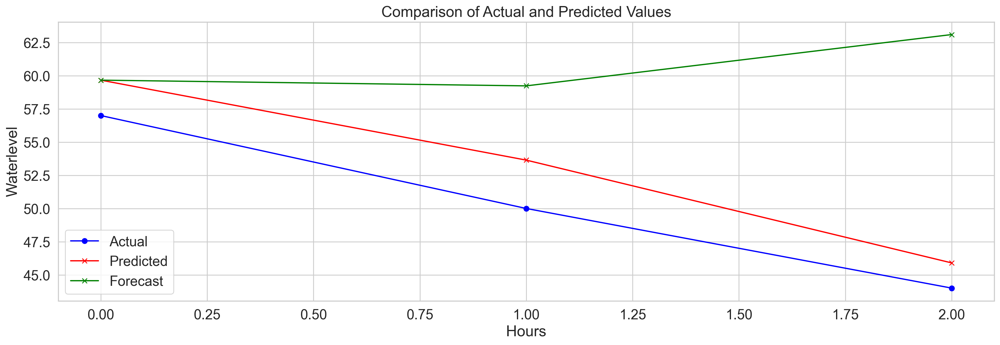

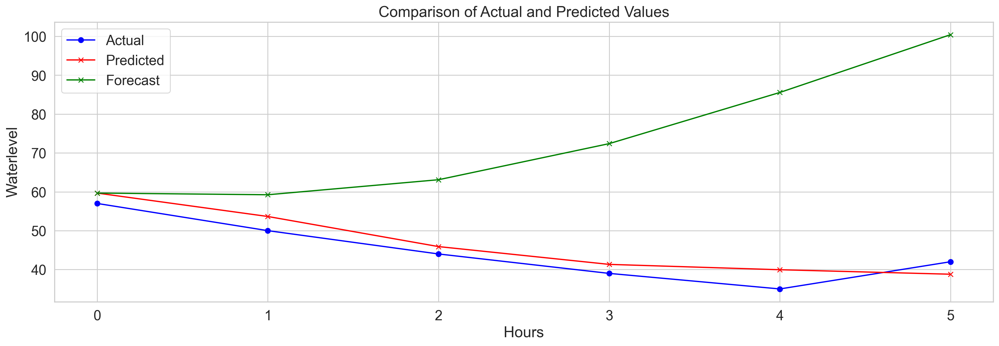

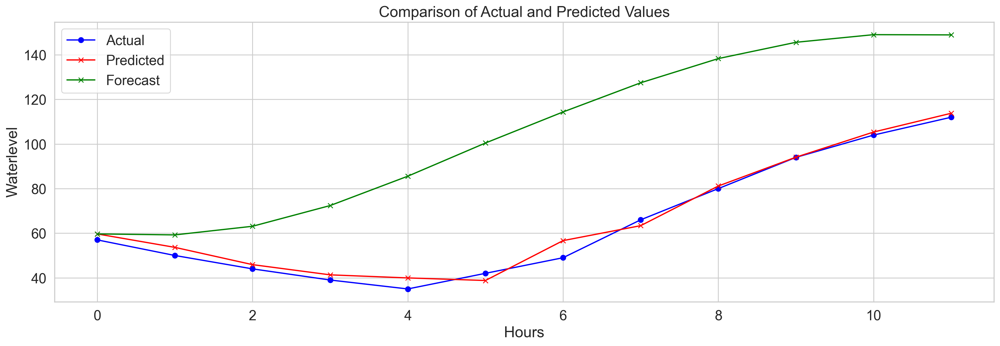

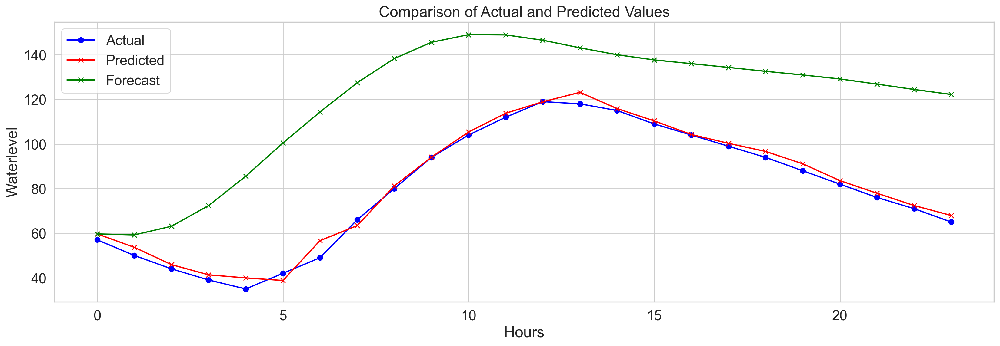

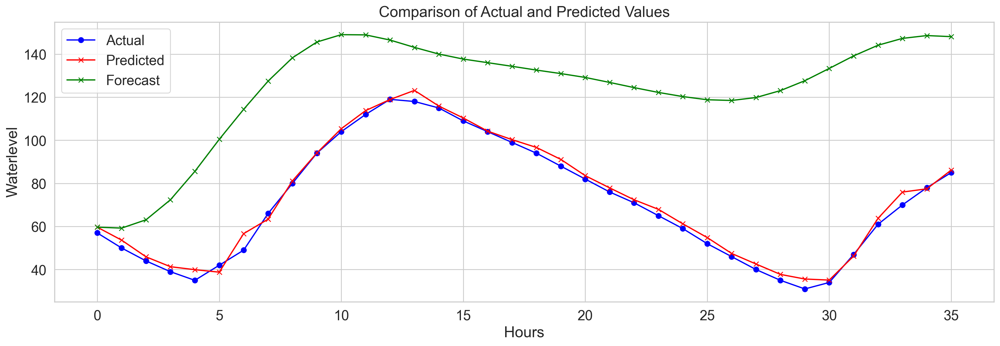

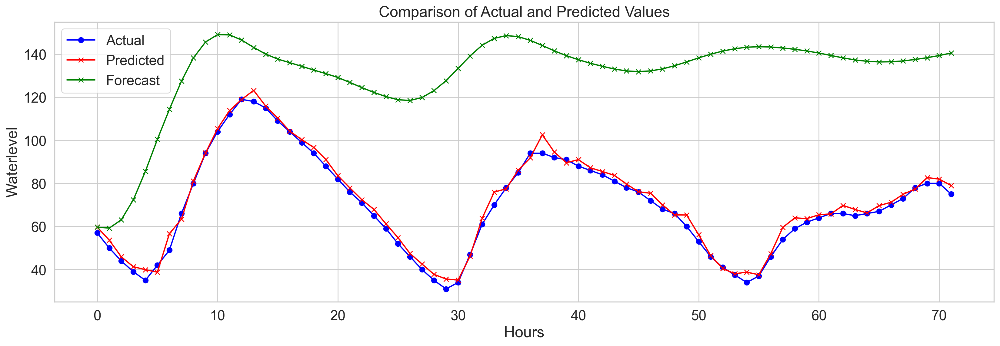

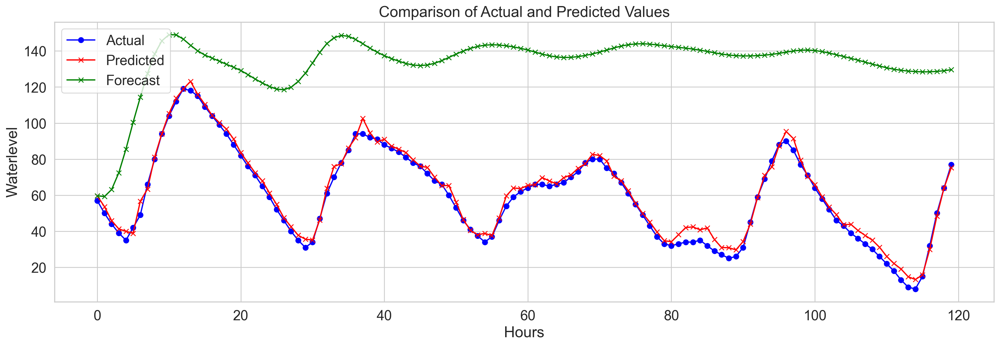

Using model LSTM 3 hours MAE: 10.335307791829104
Using model LSTM 3 hours RMSE: 12.346541838335554
Using model LSTM 3 hours MSE: 152.43709536577026
Using model LSTM 3 hours R: -0.7839035346944419
Using model LSTM 3 hours SIM: 0.6064425493567117
Using model LSTM 3 hours FSD: 1.8078752274665393
Using model LSTM 3 hours NSE: -4.401314402724155


Using model LSTM 6 hours MAE: 28.89743007471164
Using model LSTM 6 hours RMSE: 35.45520594138408
Using model LSTM 6 hours MSE: 1257.071628345957
Using model LSTM 6 hours R: -0.6427154011607574
Using model LSTM 6 hours SIM: 0.517555920693216
Using model LSTM 6 hours FSD: 1.977072214417258
Using model LSTM 6 hours NSE: -23.058787145377156


Using model LSTM 12 hours MAE: 41.00351209193468
Using model LSTM 12 hours RMSE: 45.68248863887949
Using model LSTM 12 hours MSE: 2086.889768241354
Using model LSTM 12 hours R: 0.8206747017408764
Using model LSTM 12 hours SIM: 0.6751832136832059
Using model LSTM 12 hours FSD: 1.9900117738675192
Using model LSTM 1

In [60]:
y_fc = forecast(model, hours, time)
y_pred = model.predict(x_test[time:])

y_test_original = scaler.inverse_transform(y_test)
y_pred_original = scaler.inverse_transform(y_pred)
y_fc_original = scaler.inverse_transform(y_fc)

time_forecast = [3,  6, 12, 24, 36, 72, 120]
for hours in time_forecast:
    plt.figure(figsize=(20, 6))
    
    plt.plot(y_test_original[time : time + hours].flatten(), label='Actual', color='blue', marker='o')
    plt.plot(y_pred_original[: hours], label='Predicted', color='red', marker='x')
    plt.plot(y_fc_original[: hours].flatten(), label='Forecast', color='green', marker='x')
    plt.title('Comparison of Actual and Predicted Values')
    plt.xlabel('Hours')
    plt.ylabel('Waterlevel')
    plt.legend()

    plt.show()
    
for hours in time_forecast:
    metrics = calculate_metrics(y_test_original[time : time + hours].flatten(), y_fc_original[:hours].flatten())
    for metric, value in metrics.items():
        print(f'Using model LSTM {hours} hours {metric}: {value}')

    print('\n')

In [61]:
model = keras.Sequential()

# model.add(Conv1D(8, 3, activation='relu', padding = 'same',
#                             input_shape=(x_train.shape[1], 1)))
# model.add(MaxPooling1D(pool_size=2, strides=2))
# model.add(Conv1D(16, 3, activation='relu', padding = 'same'))
# model.add(MaxPooling1D(pool_size=2, strides=2))
# model.add(Conv1D(32, 3, activation='relu', padding = 'same'))
# model.add(MaxPooling1D(pool_size=2, strides=2))
# model.add(Conv1D(64, 3, activation='relu', padding = 'same'))
# model.add(MaxPooling1D(pool_size=2, strides=2))
model.add(Conv1D(64, 3, activation='relu', padding = 'same',
                            input_shape=(x_train.shape[1], 1)))
model.add(Conv1D(128, 3, activation='relu', padding = 'same'))
model.add(MaxPooling1D(pool_size=2, strides=2))
model.add(Conv1D(256, 3, activation='relu', padding = 'same'))
model.add(MaxPooling1D(pool_size=2, strides=2))
model.add(keras.layers.LSTM(units=256,activation = 'tanh', return_sequences=True))
model.add(Dropout(0.1))


model.add(AttentionLayer())
model.add(Flatten())
model.add(Dense(100, 'relu'))
model.add(Dropout(0.1))
model.add(Dense((1), 'linear'))

model.compile(
  loss=MeanSquaredError(),
  optimizer=Adam(learning_rate=0.0001),
  metrics=[RootMeanSquaredError()]
)

model.fit(
    x_train, y_train,
    validation_data=(x_val, y_val),
    epochs=200,
    batch_size=32,
    callbacks=[EarlyStopping(monitor='val_loss', 
                             patience=10, 
                             restore_best_weights=True)],                       
    verbose=1,
    shuffle=False
)                                               
# model.save('cnn_lstm_am_es.h5')
model.summary()

Epoch 1/200
1397/1397 [==============================] - 14s 9ms/step - loss: 0.0068 - root_mean_squared_error: 0.0825 - val_loss: 0.0104 - val_root_mean_squared_error: 0.1019
Epoch 2/200
1397/1397 [==============================] - 12s 8ms/step - loss: 0.0066 - root_mean_squared_error: 0.0813 - val_loss: 0.0127 - val_root_mean_squared_error: 0.1125
Epoch 3/200
1397/1397 [==============================] - 12s 9ms/step - loss: 0.0067 - root_mean_squared_error: 0.0816 - val_loss: 0.0138 - val_root_mean_squared_error: 0.1176
Epoch 4/200
1397/1397 [==============================] - 12s 8ms/step - loss: 0.0068 - root_mean_squared_error: 0.0823 - val_loss: 0.0123 - val_root_mean_squared_error: 0.1108
Epoch 5/200
1397/1397 [==============================] - 12s 8ms/step - loss: 0.0066 - root_mean_squared_error: 0.0810 - val_loss: 0.0115 - val_root_mean_squared_error: 0.1071
Epoch 6/200
1397/1397 [==============================] - 12s 8ms/step - loss: 0.0063 - root_mean_squared_error: 0.0792 -

293/293 [==============================] - 1s 3ms/step


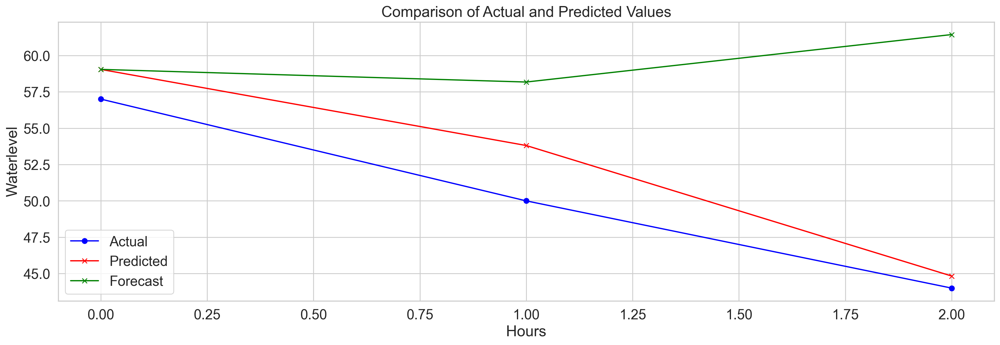

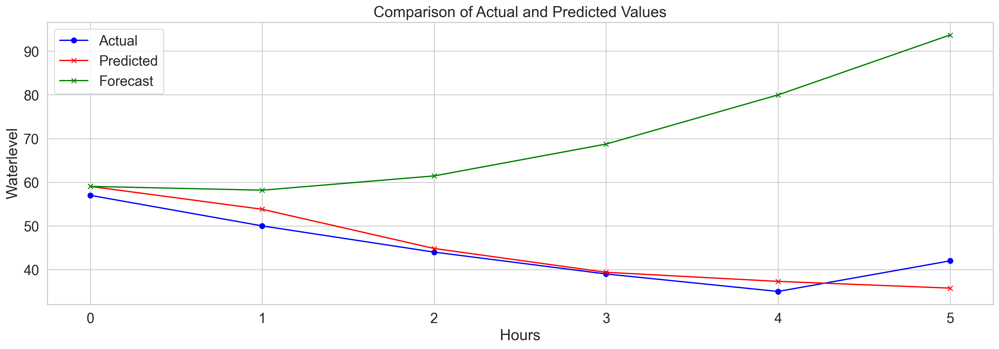

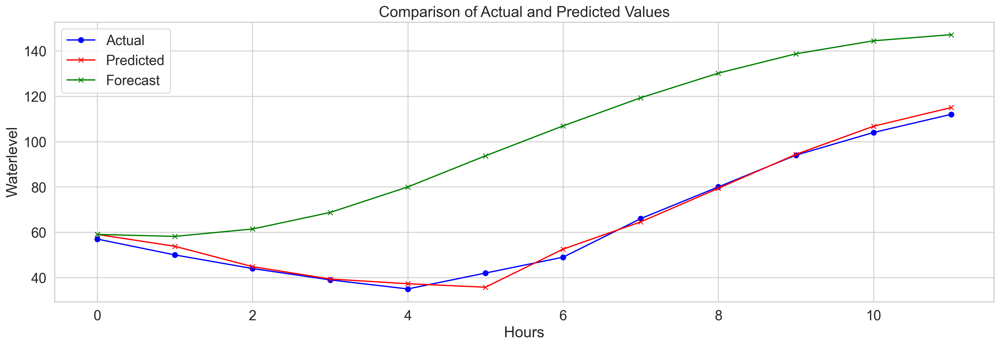

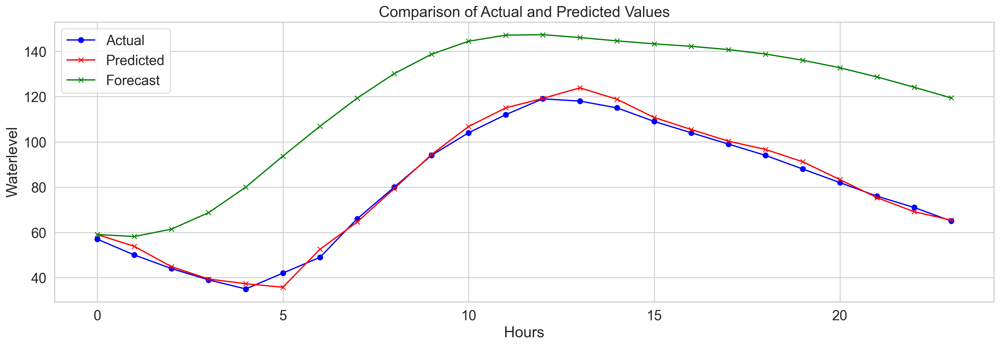

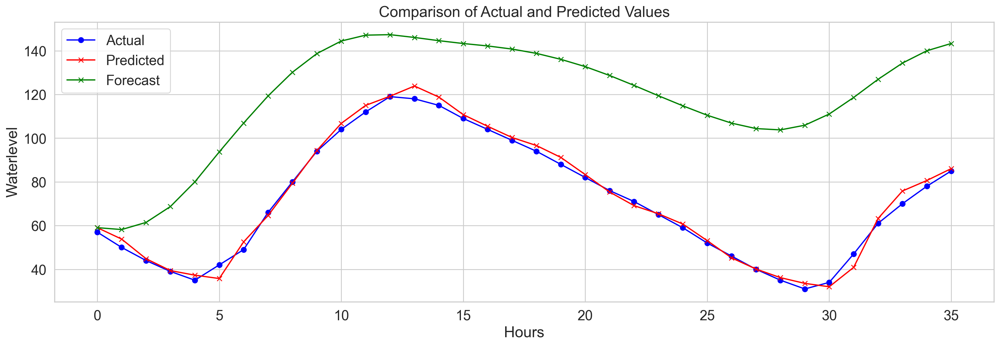

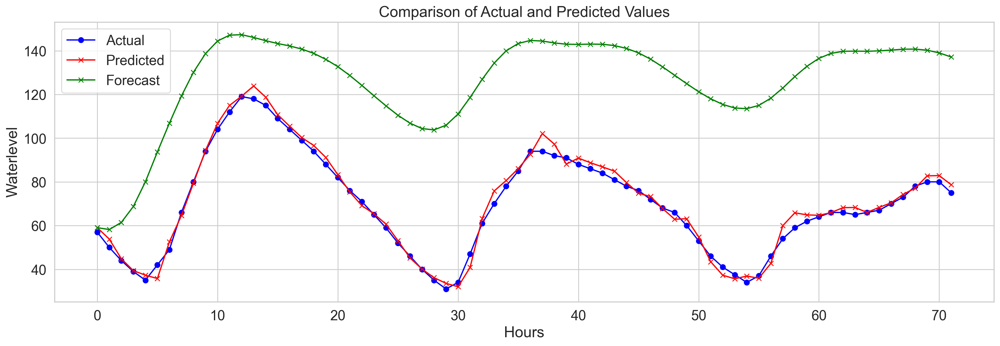

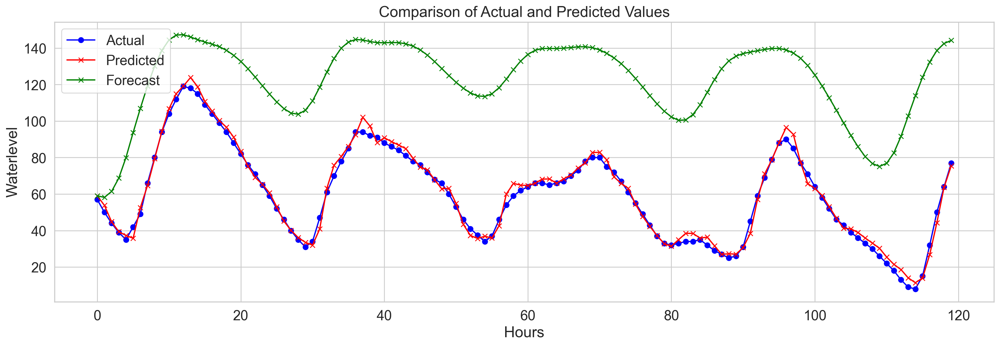

Using model LSTM 3 hours MAE: 9.218129595120743
Using model LSTM 3 hours RMSE: 11.181429001704846
Using model LSTM 3 hours MSE: 125.02435452016623
Using model LSTM 3 hours R: -0.676484704625624
Using model LSTM 3 hours SIM: 0.6350947154538217
Using model LSTM 3 hours FSD: 1.7621888774248502
Using model LSTM 3 hours NSE: -3.429996813706687


Using model LSTM 6 hours MAE: 25.675142362713814
Using model LSTM 6 hours RMSE: 31.501111813504554
Using model LSTM 6 hours MSE: 992.3200454869162
Using model LSTM 6 hours R: -0.6171091533566568
Using model LSTM 6 hours SIM: 0.542387571011614
Using model LSTM 6 hours FSD: 1.973085525610144
Using model LSTM 6 hours NSE: -17.991771205491215


Using model LSTM 12 hours MAE: 36.305574449400105
Using model LSTM 12 hours RMSE: 40.34182245080683
Using model LSTM 12 hours MSE: 1627.4626386524221
Using model LSTM 12 hours R: 0.8539592667194946
Using model LSTM 12 hours SIM: 0.6989177126424084
Using model LSTM 12 hours FSD: 1.9895625491120152
Using model LSTM

In [62]:
y_fc = forecast(model, hours, time)
y_pred = model.predict(x_test[time:])

y_test_original = scaler.inverse_transform(y_test)
y_pred_original = scaler.inverse_transform(y_pred)
y_fc_original = scaler.inverse_transform(y_fc)

time_forecast = [3,  6, 12, 24, 36, 72, 120]
for hours in time_forecast:
    plt.figure(figsize=(20, 6))
    
    plt.plot(y_test_original[time : time + hours].flatten(), label='Actual', color='blue', marker='o')
    plt.plot(y_pred_original[: hours], label='Predicted', color='red', marker='x')
    plt.plot(y_fc_original[: hours].flatten(), label='Forecast', color='green', marker='x')
    plt.title('Comparison of Actual and Predicted Values')
    plt.xlabel('Hours')
    plt.ylabel('Waterlevel')
    plt.legend()

    plt.show()
    
for hours in time_forecast:
    metrics = calculate_metrics(y_test_original[time : time + hours].flatten(), y_fc_original[:hours].flatten())
    for metric, value in metrics.items():
        print(f'Using model LSTM {hours} hours {metric}: {value}')

    print('\n')

# CNN


In [66]:
model_5 = keras.Sequential()

model_5.add(Conv1D(8, 3, activation='relu', padding = 'same',
                            input_shape=(x_train.shape[1], 1)))
model_5.add(MaxPooling1D(pool_size=2, strides=2))
model_5.add(Conv1D(16, 3, activation='relu', padding = 'same'))
model_5.add(MaxPooling1D(pool_size=2, strides=2))
model_5.add(Conv1D(32, 3, activation='relu', padding = 'same'))
model_5.add(MaxPooling1D(pool_size=2, strides=2))
model_5.add(Conv1D(64, 3, activation='relu', padding = 'same'))
model_5.add(MaxPooling1D(pool_size=2, strides=2))
model_5.add(Conv1D(128, 3, activation='relu', padding = 'same'))
model_5.add(MaxPooling1D(pool_size=2, strides=2))
model_5.add(Conv1D(256, 3, activation='relu', padding = 'same'))
model_5.add(MaxPooling1D(pool_size=2, strides=2))
# model_5.add(Conv1D(512, 3, activation='relu', padding = 'same'))
# model_5.add(MaxPooling1D(pool_size=2, strides=2))
# model_5.add(keras.layers.LSTM(units=256,activation = 'tanh'))
# model_5.add(Dropout(0.1))
model_5.add(Flatten())

model_5.add(Dense(100, 'relu'))
model_5.add(Dropout(0.1))
model_5.add(Dense((1), 'linear'))
model_5.summary()
model_5.compile(
  loss=MeanSquaredError(),
  optimizer=Adam(learning_rate=0.0001),
  metrics=[RootMeanSquaredError()]
)

model_5.fit(
    x_train, y_train,
    validation_data=(x_val, y_val),
    epochs=200,
    batch_size=32,
    callbacks=[EarlyStopping(monitor='val_loss', 
                             patience=10, 
                             restore_best_weights=True)],                       
    verbose=1,
    shuffle=False
)                                               
# model_5.save('Model_5.h5')
model_5.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_34 (Conv1D)          (None, 163, 8)            32        
                                                                 
 max_pooling1d_31 (MaxPoolin  (None, 81, 8)            0         
 g1D)                                                            
                                                                 
 conv1d_35 (Conv1D)          (None, 81, 16)            400       
                                                                 
 max_pooling1d_32 (MaxPoolin  (None, 40, 16)           0         
 g1D)                                                            
                                                                 
 conv1d_36 (Conv1D)          (None, 40, 32)            1568      
                                                                 
 max_pooling1d_33 (MaxPoolin  (None, 20, 32)          

293/293 [==============================] - 0s 1ms/step


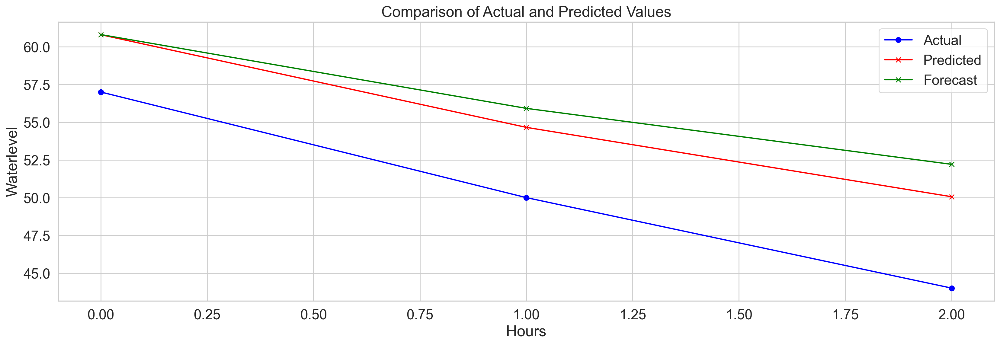

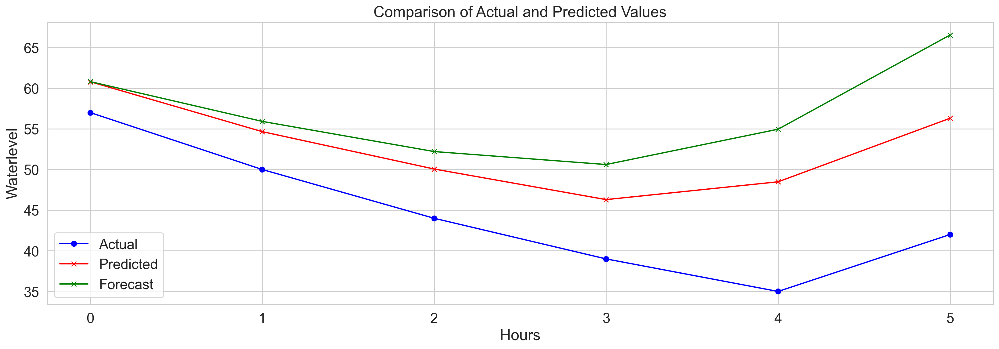

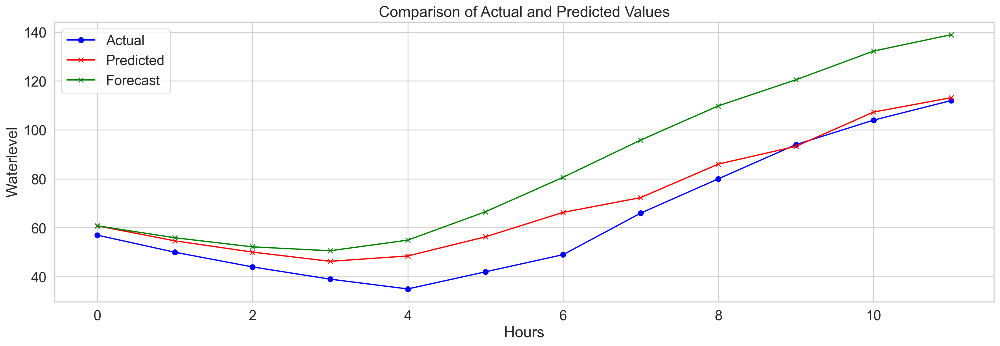

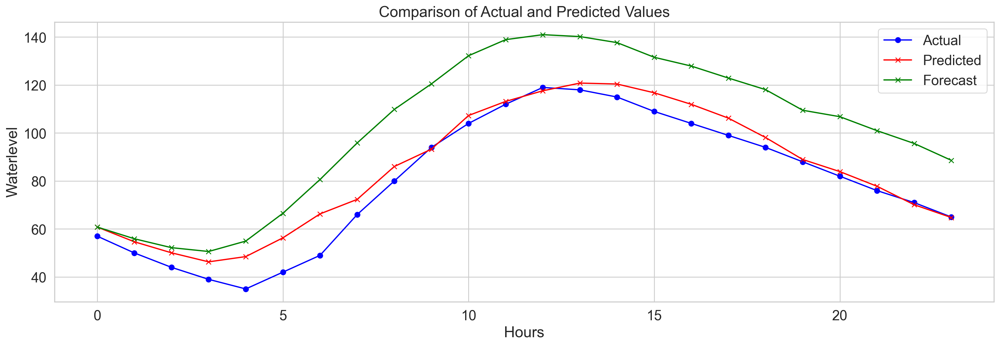

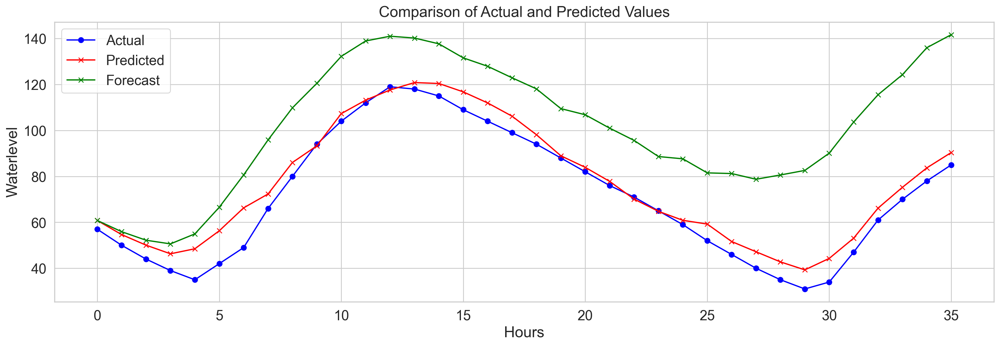

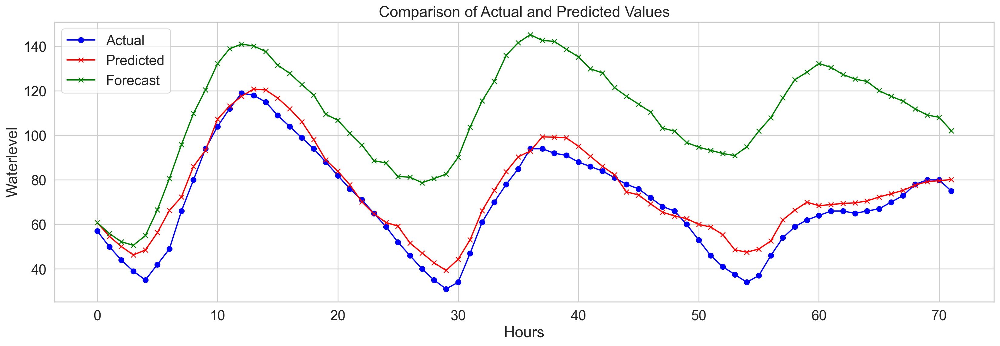

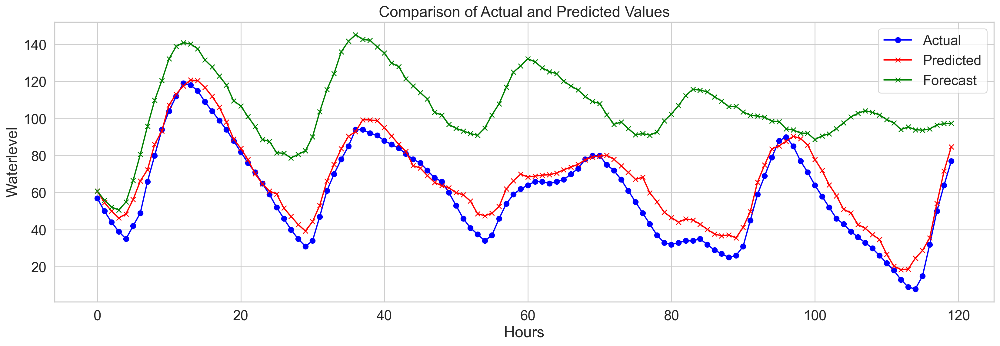

Using model LSTM 3 hours MAE: 5.9767821257313045
Using model LSTM 3 hours RMSE: 6.24066584071223
Using model LSTM 3 hours MSE: 38.94591013543249
Using model LSTM 3 hours R: 0.9994003654199536
Using model LSTM 3 hours SIM: 0.6912343684683601
Using model LSTM 3 hours FSD: 1.903322129320685
Using model LSTM 3 hours NSE: -0.3799731937751698
Using model LSTM 6 hours MAE: 12.339546625812849
Using model LSTM 6 hours RMSE: 14.446261371930772
Using model LSTM 6 hours MSE: 208.69446762613916
Using model LSTM 6 hours R: 0.31958641605602983
Using model LSTM 6 hours SIM: 0.6700806108658609
Using model LSTM 6 hours FSD: 1.9363312402117991
Using model LSTM 6 hours NSE: -2.994152490452423
Using model LSTM 12 hours MAE: 20.583936174710587
Using model LSTM 12 hours RMSE: 22.836182906189677
Using model LSTM 12 hours MSE: 521.4912497249496
Using model LSTM 12 hours R: 0.9627934528752322
Using model LSTM 12 hours SIM: 0.797791306447497
Using model LSTM 12 hours FSD: 1.9890311625519221
Using model LSTM 12 h

In [67]:
y_fc = forecast(model_5, hours, time)
y_pred = model_5.predict(x_test[time:])

y_test_original = scaler.inverse_transform(y_test)
y_pred_original = scaler.inverse_transform(y_pred)
y_fc_original = scaler.inverse_transform(y_fc)

time_forecast = [3,  6, 12, 24, 36, 72, 120]
for hours in time_forecast:
    plt.figure(figsize=(20, 6))
    
    plt.plot(y_test_original[time : time + hours].flatten(), label='Actual', color='blue', marker='o')
    plt.plot(y_pred_original[: hours], label='Predicted', color='red', marker='x')
    plt.plot(y_fc_original[: hours].flatten(), label='Forecast', color='green', marker='x')
    plt.title('Comparison of Actual and Predicted Values')
    plt.xlabel('Hours')
    plt.ylabel('Waterlevel')
    plt.legend()

    plt.show()
    
for hours in time_forecast:
    metrics = calculate_metrics(y_test_original[time : time + hours].flatten(), y_fc_original[:hours].flatten())
    for metric, value in metrics.items():
        print(f'Using model LSTM {hours} hours {metric}: {value}')


In [68]:
model_5.save('cnn_es.h5')